# Testing different ML models to predict gene set scores from surface protein data

In this notebook different reggressors (RandomForestRegressor, GradientBoostingReggressor, CatBoostRegressor) are tested to predict gene set scores from CLR tranformed surface protein data. 

5 common clusters were found in Melsen and Yang (+Crinier) datasets; 

1. Proliferating NK cells
2. CD56dim GZMK-
3. CD56dim GZMK+ 
4. CD56bright
5. lymhoid tissue-resident NK cells (lt-NK)

Here, gene set for proliferating NK cells is explored. 


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import anndata as ad
import scvi
import scanpy as sc
import seaborn as sb


from sklearn.model_selection import train_test_split 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
#markers

#Proliferating
prolif = ['S100A4', 'S100A6', 'KLRC2', 'IL32', 'GZMH', 'GNLY']

#CD56dim GZMK-
cd56dim_gzmk_neg= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1', 'GZMB'] #lower expression of GZMB in gzmk_pos cluster, so marker added in this gene set

#CD56dim GZMK+
cd56dim_gzmk_pos = ['GZMK', 'SELL']

#CD56bright
cd56bright= ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R', 'KLRC1']
#cd56bright_prot= ['CD56', 'CD62L', "CD2_prot", 'CD127']  #CD117 ab not used in this dataset

#lt-NK
lt_nk= ['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']


In [3]:
#loading Neurips dataset
adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [4]:
adata_neurips

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [5]:
adata_neurips.obs['Site'].unique().tolist()

['site4', 'site3', 'site1', 'site2']

In [6]:
#selecting only sites 1 and 4 (good ab signals), from Neurips dataset

eg=adata_neurips[(adata_neurips.obs['Site'] == "site4") | (adata_neurips.obs['Site'] == "site1")].copy() 

In [7]:
eg.obs['Site'].unique().tolist()

['site4', 'site1']

In [8]:
#selecting only NK cells

eg_nk = eg[(eg.obs['cell_type'] == "NK") | (eg.obs['cell_type'] == "NK CD158e1+")].copy()   


In [9]:
eg_nk.obs['cell_type'].unique().tolist()

['NK', 'NK CD158e1+']

In [10]:
#This includes now selected cells (NK, ILC, gd T) from site 1 and 4
eg_nk

AnnData object with n_obs × n_vars = 2640 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

## Calculating gene scores for gene sets

In [11]:
markers = prolif

In [12]:
markers

['S100A4', 'S100A6', 'KLRC2', 'IL32', 'GZMH', 'GNLY']

In [13]:
#calculating scores for gene set

sc.tl.score_genes(eg_nk, markers, score_name = 'marker_score')

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [14]:
eg_nk.obs['marker_score']

GTAGTACCAATCCTTT-1-s4d1    0.242802
CTGTGGGTCATGCGGC-1-s4d1    0.746696
GCAACATTCGCAAGAG-1-s4d1    0.070373
TCACGGGTCGCACGAC-1-s4d1    0.850457
CGCCAGAAGACCATTC-1-s4d1    1.754267
                             ...   
ATCATTCGTCCAATCA-1-s1d3    0.191326
ACATTTCCAGCAGTGA-1-s1d3    0.621183
TGAGACTTCCTTCAGC-1-s1d3    0.715489
GAGATGGTCCGCCTAT-1-s1d3    0.469420
ACCTGTCTCACAGTGT-1-s1d3    0.902909
Name: marker_score, Length: 2640, dtype: float64

In [15]:
prot = eg_nk.obsm['protein_expression_clr_neurips']

In [17]:
#dropping columns containing only zeros

prot = prot.loc[:, (prot!=0).any(axis=0)]

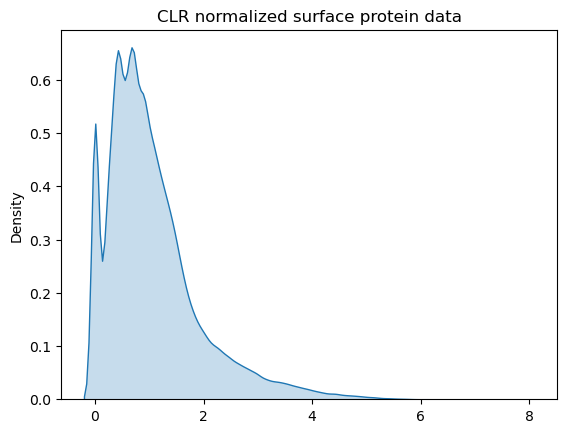

In [18]:
flatten_df = prot.to_numpy().flatten()

sb.kdeplot(flatten_df, fill = True) ; 


plt.title("CLR normalized surface protein data") ;

In [19]:
score = eg_nk.obs['marker_score']

In [20]:
score

GTAGTACCAATCCTTT-1-s4d1    0.242802
CTGTGGGTCATGCGGC-1-s4d1    0.746696
GCAACATTCGCAAGAG-1-s4d1    0.070373
TCACGGGTCGCACGAC-1-s4d1    0.850457
CGCCAGAAGACCATTC-1-s4d1    1.754267
                             ...   
ATCATTCGTCCAATCA-1-s1d3    0.191326
ACATTTCCAGCAGTGA-1-s1d3    0.621183
TGAGACTTCCTTCAGC-1-s1d3    0.715489
GAGATGGTCCGCCTAT-1-s1d3    0.469420
ACCTGTCTCACAGTGT-1-s1d3    0.902909
Name: marker_score, Length: 2640, dtype: float64

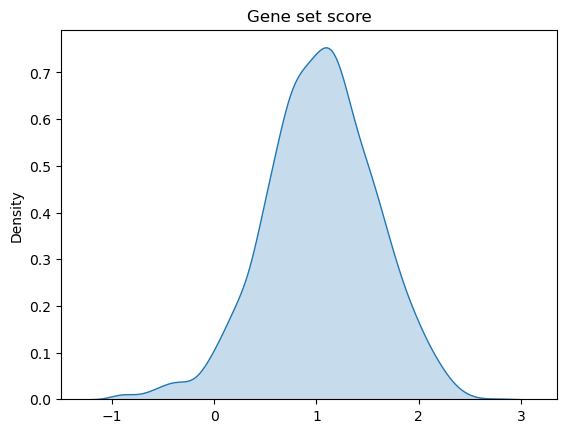

In [21]:
flatten_df1 = score.to_numpy().flatten()

sb.kdeplot(flatten_df1, fill = True) ; 

plt.title("Gene set score") ;

In [22]:
#Creating df containign surface protein data + scores for gene sets

a = score
b = prot

df =pd.concat([a, b], axis=1)


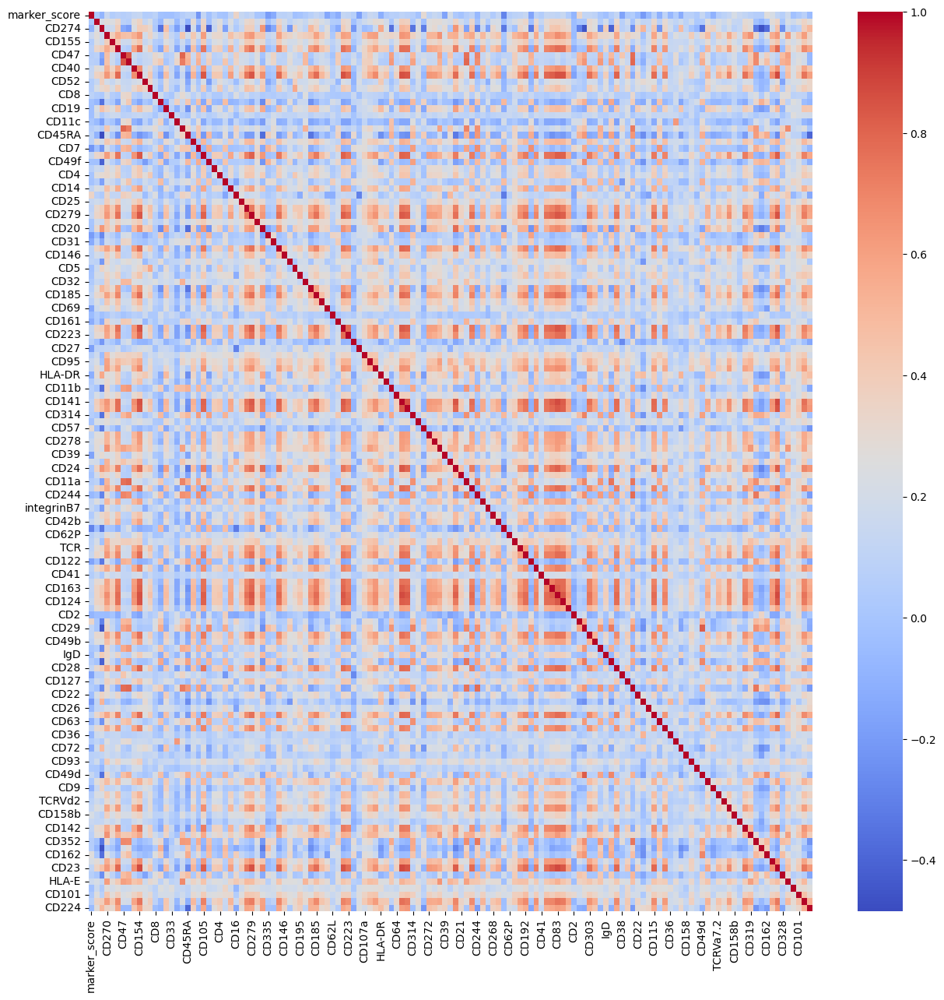

In [23]:
plt.figure(figsize=(15,15))
sb.heatmap(data=df.corr(),cmap='coolwarm')
plt.show()

## 1. RandomForestRegressor

In [34]:
#Random forest

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params = {#'bootstrap': [True, False],
 'max_depth': [3,5,7],
 #'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
 'min_samples_leaf': [2, 5, 10],
 #'min_samples_split': [2, 5, 10] ,
 #'n_estimators': [10, 50, 100]
}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(RandomForestRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model = result.best_estimator_
y_pred = best_model.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)
    

Mean squared error: 0.18 R2 score: 0.39


In [35]:
#Mean training scores

print(mean_train_score)

[array([-0.19025049, -0.19006981, -0.19039056, -0.14929676, -0.15033808,
       -0.15382332, -0.10702201, -0.11120985, -0.12094219])]


In [36]:
# The best score and parameters

print(result.best_score_)
print(result.best_params_)

-0.18478329205251182
{'max_depth': 7, 'min_samples_leaf': 10}


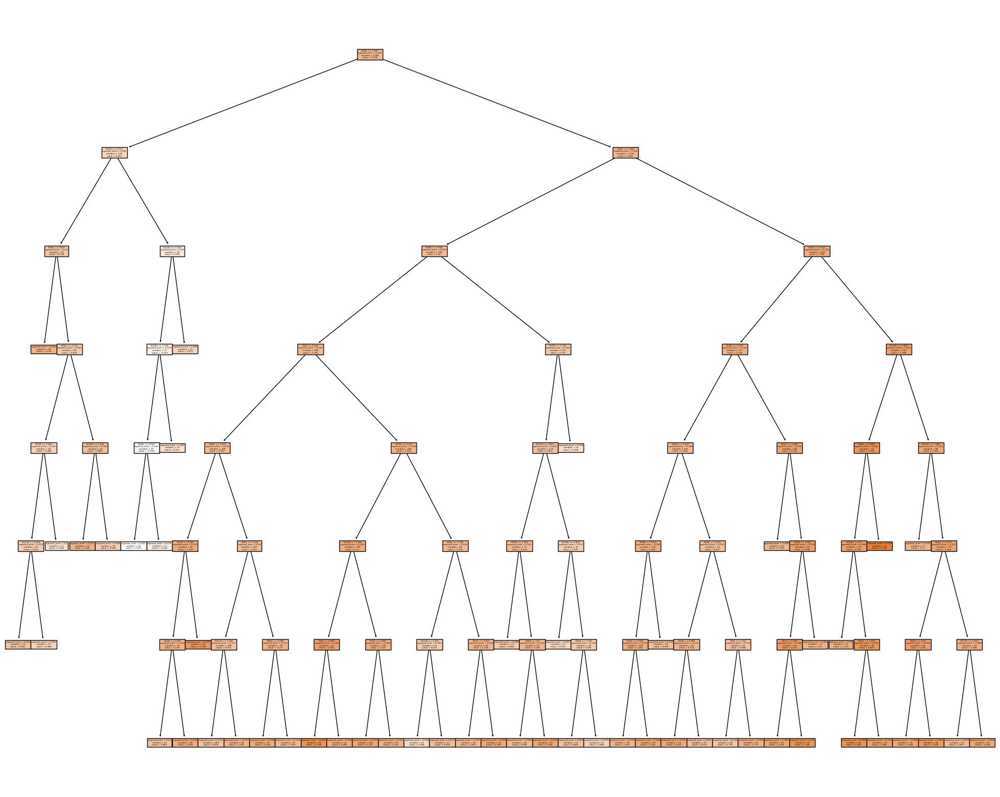

In [37]:
from sklearn import tree

plt.figure(figsize=(25, 20)) # Resize figure
tree.plot_tree(best_model.estimators_[0], filled = True) ;

plt.show()

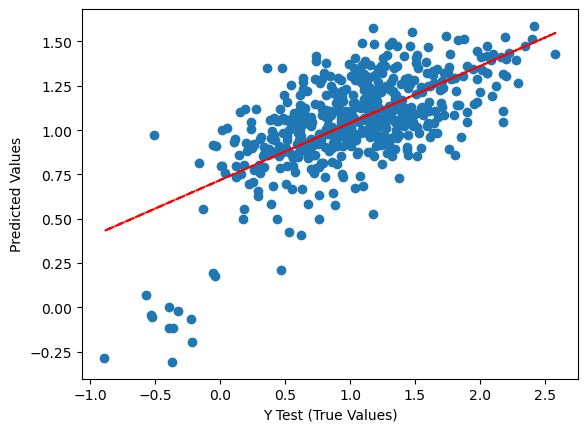

In [38]:
plt.scatter(y_test, y_pred)

# Add a trendline
z = np.polyfit(y_test, y_pred, 1)
p = np.poly1d(z)
plt.plot(y_test, p(y_test), 'r--')
# Add labels
plt.xlabel('Y Test (True Values)')
plt.ylabel('Predicted Values')
plt.show()

<AxesSubplot: xlabel='marker_score', ylabel='Density'>

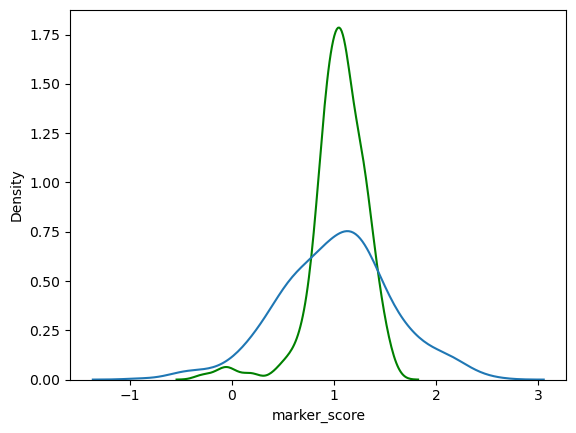

In [39]:
sb.kdeplot(y_pred, color = "g") #predicted values
sb.kdeplot(y_test) #observed values

In [40]:
#Feature importances

importances_rf = best_model.feature_importances_
importances_rf = pd.Series(importances_rf, index=prot.columns)
importances_rf=importances_rf.sort_values(ascending=False)

print(importances_rf.head(10))

CD16     0.172907
CD226    0.106226
CD57     0.078772
CD162    0.055353
CD7      0.049828
CD54     0.047743
CD122    0.046771
CD38     0.035965
CD69     0.029062
CD85j    0.018309
dtype: float64


In [41]:
#df from the top 20 important markers
importances_rf=pd.DataFrame(importances_rf)
importances_rf_top=importances_rf[0:20]
importances_rf_top=importances_rf_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


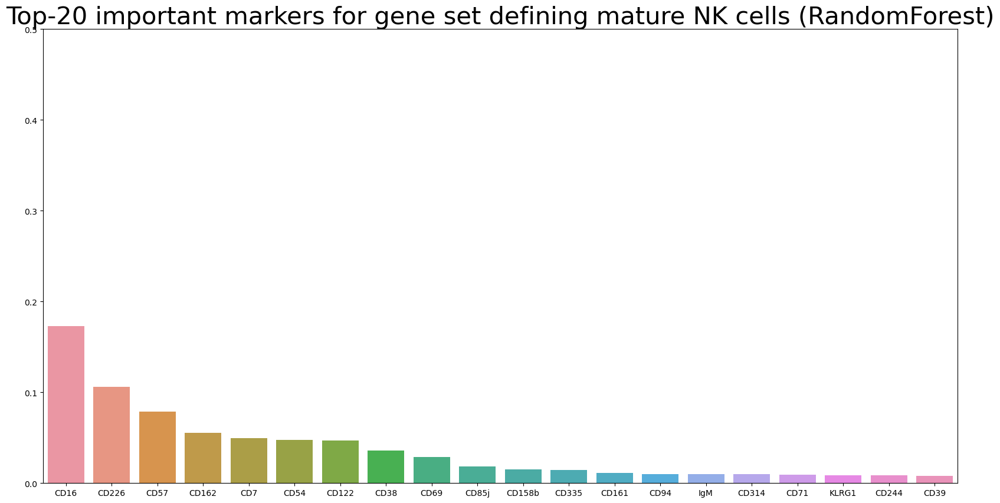

In [42]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.5)
a=sb.barplot(data=importances_rf_top)

plt.title("Top-20 important markers for gene set defining mature NK cells (RandomForest)", fontsize = 30) ;


## 2. Dummy Reggressor

In [24]:
from sklearn.dummy import DummyRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=0)

lm_dummy_mean = DummyRegressor(strategy = 'mean').fit(X_train, y_train)
  
lm_dummy_median = DummyRegressor(strategy = 'median').fit(X_train, y_train)

y_predict_dummy_mean = lm_dummy_mean.predict(X_test)
y_predict_dummy_median = lm_dummy_median.predict(X_test)

In [25]:
print("Mean squared error (dummy): {:.2f}".format(mean_squared_error(y_test, 
                                                                     y_predict_dummy_mean)))
  
print("r2_score (dummy mean): {:.2f}".format(r2_score(y_test, y_predict_dummy_mean)))
print("r2_score (dummy median): {:.2f}".format(r2_score(y_test, y_predict_dummy_median)))

Mean squared error (dummy): 0.30
r2_score (dummy mean): -0.00
r2_score (dummy median): -0.00


## 3. GragientBoostingRegressor

In [37]:
#Gradient boosting regressor

from sklearn.ensemble import GradientBoostingRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params =  {'max_depth': [3,5,7],
          'min_samples_leaf': [2, 5, 10]}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(GradientBoostingRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_gbr = result.best_estimator_
y_pred = best_model_gbr.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.18 R2 score: 0.41


In [38]:
print(mean_train_score)

[array([-0.09716552, -0.09686602, -0.09814194, -0.02880892, -0.02939992,
       -0.03383647, -0.00311122, -0.00383898, -0.00726726])]


<AxesSubplot: xlabel='marker_score', ylabel='Density'>

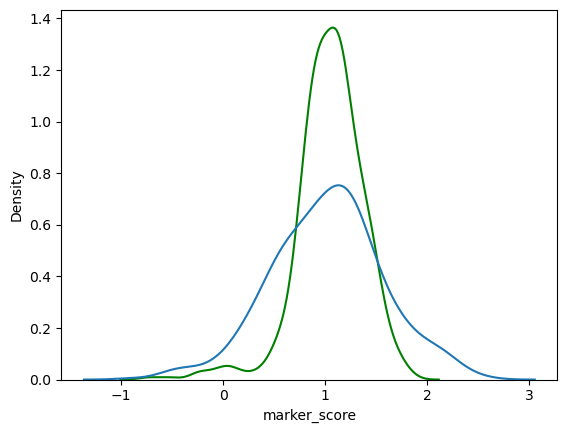

In [39]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [40]:
importances_gbr = best_model_gbr.feature_importances_
importances_gbr = pd.Series(importances_gbr, index=prot.columns)
importances_gbr=importances_gbr.sort_values(ascending=False)

print(importances_gbr.head(10))

CD16      0.129937
CD226     0.103503
CD57      0.077343
CD54      0.063663
CD38      0.053882
CD162     0.050771
CD7       0.050290
CD122     0.047301
CD85j     0.025185
CD158b    0.022099
dtype: float64


In [41]:
#df from the top 20 important markers
importances_gbr=pd.DataFrame(importances_gbr)
importances_gbr_top=importances_gbr[0:20]
importances_gbr_top=importances_gbr_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


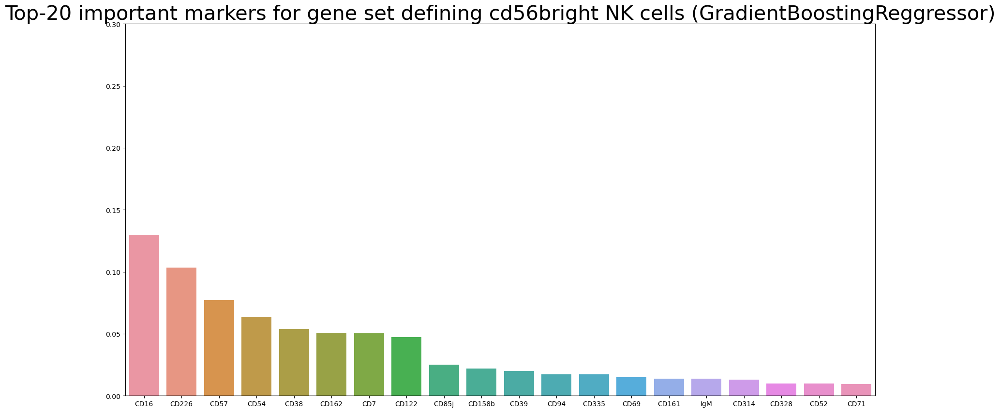

In [42]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.3)
a=sb.barplot(data=importances_gbr_top)

plt.title("Top-20 important markers for gene set defining proliferating NK cells (GradientBoostingReggressor)", fontsize = 30) ;



## 4. CatBoostRegressor

In [26]:
from catboost import CatBoostRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params= {'depth': [6,8,10],
        'learning_rate' : [0.01, 0.05, 0.1],
        'iterations'    : [30, 50, 100]
                 }

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(CatBoostRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train, verbose=0)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_cb = result.best_estimator_
y_pred = best_model_cb.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.18 R2 score: 0.40


<AxesSubplot: xlabel='marker_score', ylabel='Density'>

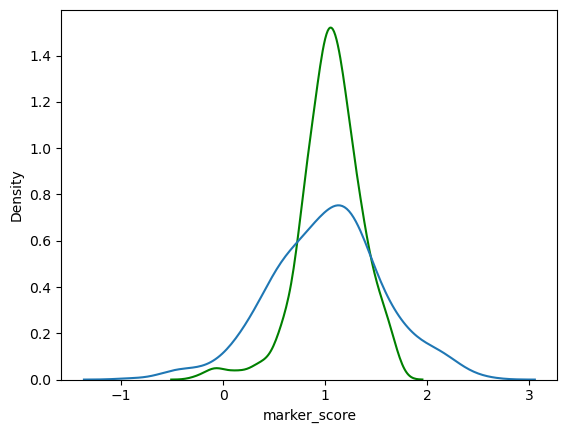

In [33]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [34]:
importances_cb = best_model_cb.feature_importances_
importances_cb = pd.Series(importances_cb, index=prot.columns)
importances_cb=importances_cb.sort_values(ascending=False)

print(importances_cb.head(10))

CD226    8.022950
CD16     6.796945
CD57     5.011608
CD54     4.095279
CD38     3.986079
CD7      3.449061
CD335    3.370366
CD162    3.035808
CD122    2.640171
CD94     2.106414
dtype: float64


In [35]:
#df from the top 20 important markers
importances_cb=pd.DataFrame(importances_cb)
importances_cb_top=importances_cb[0:20]
importances_cb_top=importances_cb_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


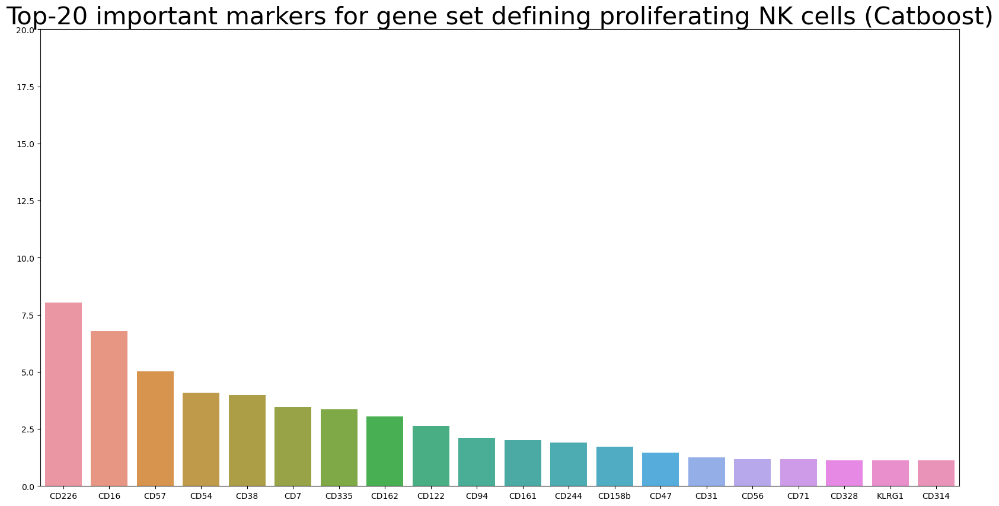

In [36]:
plt.figure(figsize=(20,10))
plt.ylim(0,20)
a=sb.barplot(data=importances_cb_top)

plt.title("Top-20 important markers for gene set defining proliferating NK cells (Catboost)", fontsize = 30) ;




## 5. UMAP visualization

In [27]:
markers_prot = ['CD226', 'CD16', 'CD57', 'CD54', 'CD38', 'CD7', 'CD335', 'CD162', 'CD122', 'CD94']


In [28]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips, use_rep="X_totalVI")   

sc.tl.umap(adata_neurips)

In [29]:
#selecting one sample from Neurips

sample =adata_neurips[adata_neurips.obs['POOL'] == "s4d1"].copy()

In [30]:
#saving protein information

prot=sample.obsm['protein_expression_clr_neurips']

In [31]:
#Some genes have same names, so _prot added after some proteins

prot=prot.rename(columns={'CD2': 'CD2_prot', 'CD83': 'CD83_prot', 'HLA-E': 'HLA-E_prot', 'CD163': 'CD163_prot', 'CX3CR1': 'CX3CR1_prot', 'CD52': 'CD52_prot', 'CD24': 'CD24_prot', 'KLRG1': 'KLRG1_prot', 'CD69': 'CD69_prot', 'CD226':'CD226_prot', 'CD47': 'CD47_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD44': 'CD44_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})

In [32]:
#adding protein information to obs

a = sample.obs
b = prot

adata_sample=pd.concat([a, b], axis=1)
sample.obs=adata_sample

sample

AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

In [33]:
sample

AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


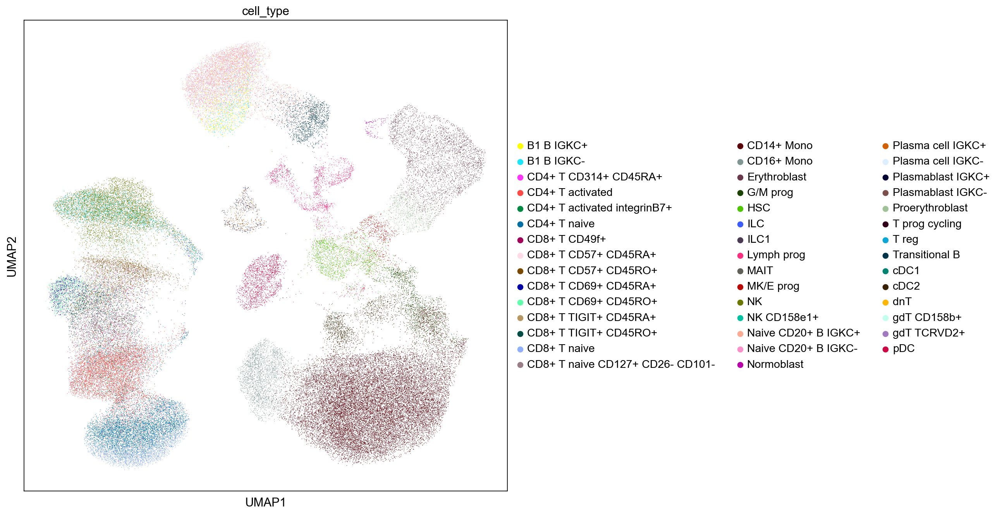

In [34]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips, color = ['cell_type'])

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


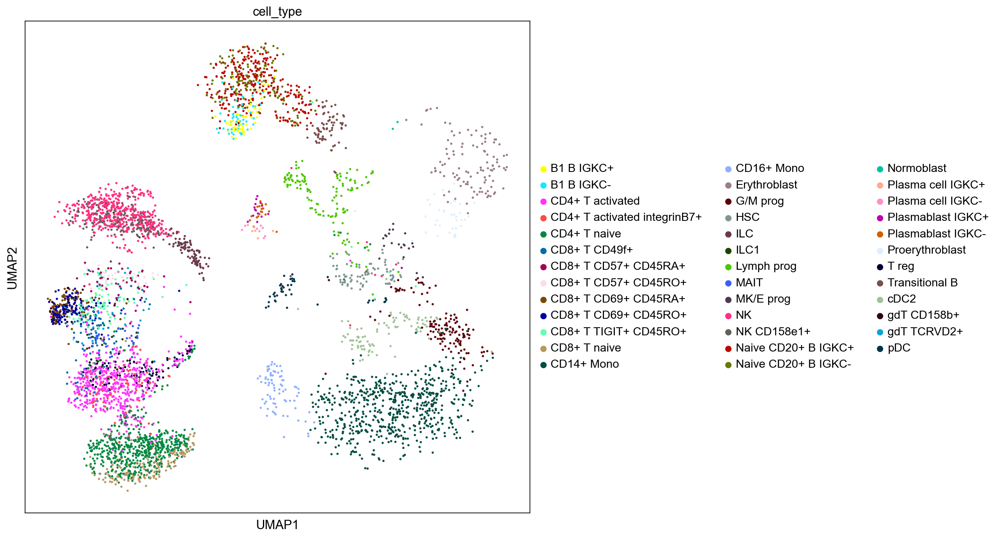

In [35]:
#only one sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = ['cell_type'])

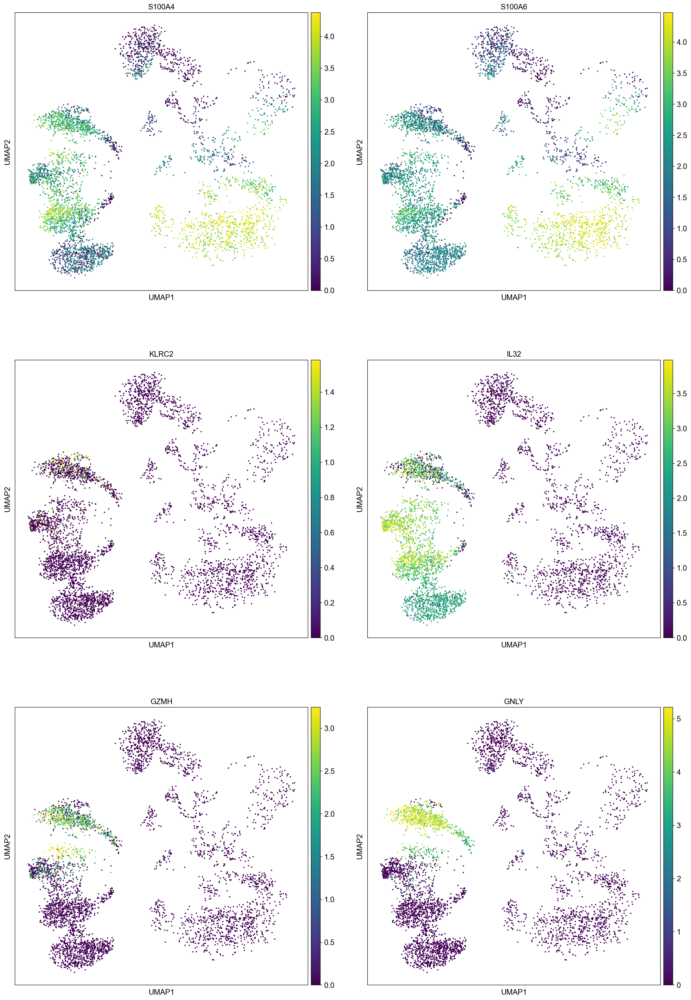

In [36]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers,  vmax="p99", ncols = 2)

UMAPs above represent RNA markers for proliferating NK cells (according to Melsen et al., paper). 

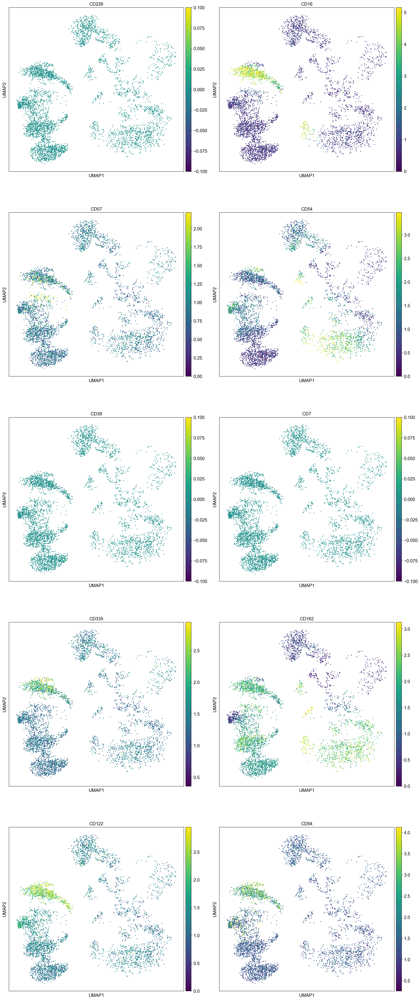

In [37]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers_prot,  vmax="p99", ncols = 2)

Markers above are important features (surface proteins) identified by CatBoostReggressor. 